In [1]:
import sys
sys.path.append('..')

In [2]:
import os
from typing import List, Tuple
import random

In [3]:
import matplotlib.pyplot as plt
from glob import glob
import numpy as np
import cv2 as cv

In [4]:
from src.data_access.data_transformations import EntryTransformation
from src.data_access.folds_generation import FoldsGenerator
from src.primitives.data_access import FoldsGeneratorSpecs, RandomSplitSpecs, \
    RotationBasedClassSplit, DataSetExampleBatch
from src.visualisation.plotting import make_column_plot
from src.config import DATASET_PATH, CLASS_MAPPINGS, BACKGROUNDS_DIR_NAME
from src.primitives.images import ImageSize
from src.utils.images import load_image

In [5]:
TO_SHOW_FROM_SPLIT = 16

In [6]:
def adjust_batch_to_show(batch: DataSetExampleBatch
                         ) -> List[Tuple[np.ndarray, np.ndarray]]:
    images, masks = batch
    return [
        (image, mask)  for image, mask in zip(images, masks)
    ]

In [7]:
random_split_specs = RandomSplitSpecs(
    classes=set(CLASS_MAPPINGS.keys()),
    splits_number=1,
    training_samples_factor=0.8
)

In [8]:
training_angles = {
    "adapter": {0, 30, 90},
    "bottle": {0, 60},
    "box": {0, 60},
    "clamp": {0, 60},
    "drill": {0, 30, 90},
    "duck": {0, 60}
}

test_angles = {
    "adapter": {60},
    "bottle": {30},
    "box": {30},
    "clamp": {30},
    "drill": {60},
    "duck": {30}
}


rotation_based_class_split = RotationBasedClassSplit(
    training_angles=training_angles,
    test_angles=test_angles
)

In [9]:
folds_generator_specs = FoldsGeneratorSpecs(
    random_split_specs=random_split_specs,
    rotation_based_splits=[rotation_based_class_split]
)

In [10]:
genarator = FoldsGenerator(
    dataset_path=DATASET_PATH,
    generator_specs=folds_generator_specs
)

In [11]:
backgrounds_wildrcard = os.path.join(DATASET_PATH, BACKGROUNDS_DIR_NAME, "*.jpg")
backgrounds_paths = glob(backgrounds_wildrcard)
backgrounds = [load_image(path, cv.COLOR_BGR2RGB) for path in backgrounds_paths]

In [12]:
target_size_element = ImageSize(
    height=480,
    width=640
)

transformation = EntryTransformation(
    class_mapping=CLASS_MAPPINGS,
    target_size=target_size_element,
    backgrounds=backgrounds
)

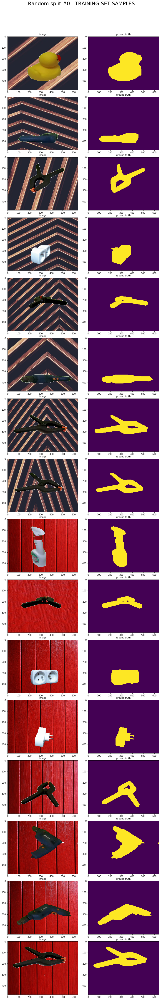

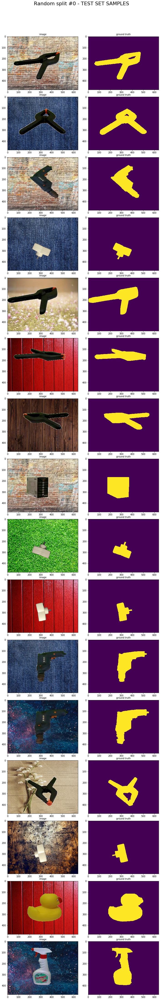

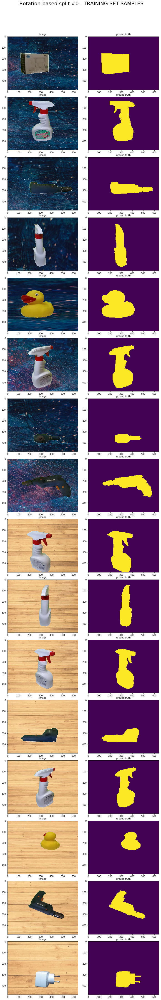

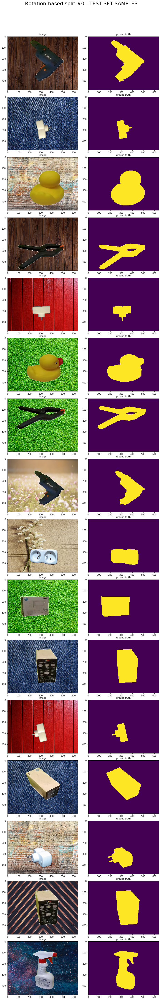

In [13]:
COLUMNS = ['image', 'ground truth']

for split in genarator.generate_folds():
    training_set_examples = split.training_set.examples
    random.shuffle(training_set_examples)
    training_set_examples = transformation.transform_batch(
        training_set_examples[:TO_SHOW_FROM_SPLIT]
    )
    training_set_examples = adjust_batch_to_show(
        batch=training_set_examples
    )
    make_column_plot(
        title=f'{split.name} - TRAINING SET SAMPLES',
        column_names=COLUMNS,
        content=training_set_examples
    )
    plt.show()
    test_set_examples = split.test_set.examples
    random.shuffle(test_set_examples)
    test_set_examples = transformation.transform_batch(
        test_set_examples[:TO_SHOW_FROM_SPLIT]
    )
    test_set_examples = adjust_batch_to_show(
        batch=test_set_examples
    )
    make_column_plot(
        title=f'{split.name} - TEST SET SAMPLES',
        column_names=COLUMNS,
        content=test_set_examples
    )
    plt.show()